In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.offline import iplot
import plotly.graph_objs as go
import matplotlib.dates as mdates
from wordcloud import WordCloud

In [ ]:
df_train = pd.read_csv("/content/drive/My Drive/Data/fake-news/train.csv", encoding='utf-8')



In [ ]:
print(df_train.shape)
df_train.head()

(20800, 5)


,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20800 entries, 0 to 20799
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      20800 non-null  int64 
 1   title   20242 non-null  object
 2   author  18843 non-null  object
 3   text    20761 non-null  object
 4   label   20800 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 812.6+ KB


In [ ]:
df_train.isnull().sum()

id           0
title      558
author    1957
text        39
label        0
dtype: int64

In [ ]:
df_train.author.value_counts()[:10]

Pam Key                243
admin                  193
Jerome Hudson          166
Charlie Spiering       141
John Hayward           140
Katherine Rodriguez    124
Warner Todd Huston     122
Ian Hanchett           119
Breitbart News         118
Daniel Nussbaum        112
Name: author, dtype: int64

In [ ]:
# Plot wordCloud for entire text column
def word_rep(df, label_value):
  from wordcloud import WordCloud
  wordcloud__ = WordCloud(
                          background_color='white',
                          max_words=250,
                          max_font_size=40,
                          random_state=1705
                         ).generate(str(df['text'].dropna()))
  def cloud_plot(wordcloud):
    fig = plt.figure(1, figsize=(8,6))
    plt.title('Word Cloud Representation For {}'.format(label_value))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()

  cloud_plot(wordcloud__)

# Wordcloud Representation for Text

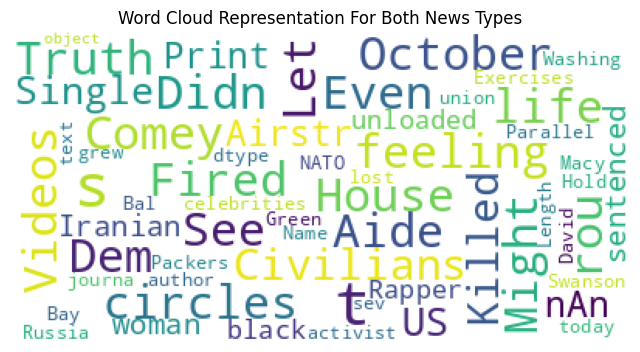

In [ ]:
word_rep(df_train, 'Both News Types')

# WordCloud Representation for label 1: Fake

In [ ]:
fake_news = df_train[df_train.label==1 ]     # extract fake news values from train dataframe object.

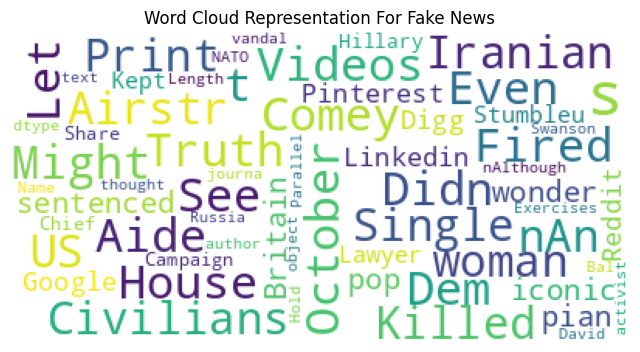

In [ ]:
word_rep(fake_news,'Fake News')

# Wordcloud representation for label 0: Reliable

In [ ]:
real_news = df_train[df_train.label==0 ]     # extract real news values from train dataframe object.

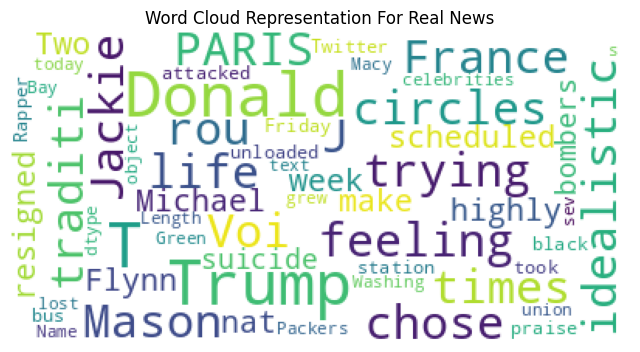

In [ ]:
word_rep(real_news,'Real News')

In [ ]:
#Group wise count for each label
temp = df_train.groupby('label').count()['text'].reset_index().sort_values(by='text',ascending=False)  # get the count of each label
temp.style.background_gradient(cmap='Purples')

,label,text
0,0,10387
1,1,10374


## Character count in each news type

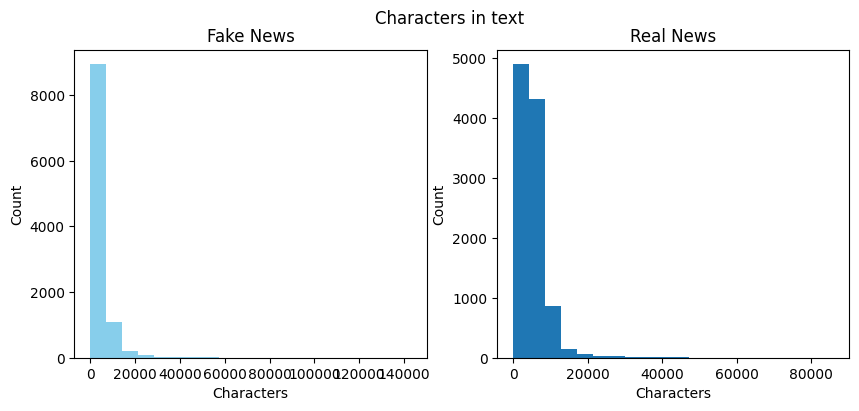

In [ ]:
fig,(ax1,ax2)= plt.subplots(ncols=2, figsize=(10, 4), dpi=100)
length=df_train[df_train["label"]==1]['text'].str.len()
ax1.hist(length,bins = 20,color='skyblue')
ax1.set_title('Fake News')
ax1.set_xlabel('Characters')
ax1.set_ylabel('Count')
length=df_train[df_train["label"]==0]['text'].str.len()
ax2.hist(length, bins = 20)
ax2.set_title('Real News')
ax2.set_xlabel('Characters')
ax2.set_ylabel('Count')
fig.suptitle('Characters in text')
plt.show()


In [ ]:
# Remove Duplicates
df_train.drop_duplicates(subset=['text'],keep='first',inplace=True)
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20387 entries, 0 to 20799
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      20387 non-null  int64 
 1   title   19869 non-null  object
 2   author  18533 non-null  object
 3   text    20386 non-null  object
 4   label   20387 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 955.6+ KB


There are no duplicate values found.

In [ ]:
df = df_train[['text','label']].copy()
df.dropna(inplace = True)

In [ ]:
df.shape

(20386, 2)

## Finetuning Bert Model on the train data

In [ ]:
!pip install transformers -q

In [ ]:
#Import required libraries

import pandas as pd
import numpy as np
import re
import random
import time
import torch
from sklearn.model_selection import train_test_split
from transformers import BertTokenizer, BertModel, AdamW, get_linear_schedule_with_warmup
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from torch.autograd.function import InplaceFunction
import math
import torch.nn as nn
import torch.nn.init as init
import torch.nn.functional as F
from torch.nn import Parameter
from keras.utils import to_categorical
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

import warnings
warnings.filterwarnings('ignore')

In [ ]:
#Split train data into train and val sets
X = df.text.values
y = df.label.values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

In [ ]:
#GPU check and use
if torch.cuda.is_available():
    device = torch.device("cuda")
    print(f'There are {torch.cuda.device_count()} GPU(s) available.')
    print('Device name:', torch.cuda.get_device_name(0))

else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

There are 1 GPU(s) available.
Device name: Tesla T4


In [ ]:
#Preprocessing before tokenizing
def text_preprocessing(text):
    # Replace '&amp;' with '&'
    text = re.sub(r'&amp;', '&', text)
    # Remove trailing whitespace
    text = re.sub(r'\s+', ' ', text).strip()
    return text

In [ ]:
# Loading the BERT tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased', do_lower_case=True)

# Function to tokenize input text
def preprocessing_for_bert(data):
    """Perform required preprocessing steps for pretrained BERT.
    @param    data (np.array): Array of texts to be processed.
    @return   input_ids (torch.Tensor): Tensor of token ids to be fed to a model.
    @return   attention_masks (torch.Tensor): Tensor of indices specifying which tokens should be attended to by the model.
    """
    # Create empty lists to store outputs
    input_ids = []
    attention_masks = []
    # For every sentence...
    for sent in data:
        # `encode_plus` will:
        #    (1) Tokenize the sentence
        #    (2) Add the `[CLS]` and `[SEP]` token to the start and end
        #    (3) Truncate/Pad sentence to max length
        #    (4) Map tokens to their IDs
        #    (5) Create attention mask
        #    (6) Return a dictionary of outputs
        encoded_sent = tokenizer.encode_plus(
            text=text_preprocessing(sent),  # Preprocess sentence
            add_special_tokens=True,        # Add `[CLS]` and `[SEP]`
            max_length=MAX_LEN,             # Max length to truncate/pad
            pad_to_max_length=True,         # Pad sentence to max length
            #return_tensors='pt',           # Return PyTorch tensor
            return_attention_mask=True,      # Return attention mask
            truncation=True
            )
        # Add the outputs to the lists
        input_ids.append(encoded_sent.get('input_ids'))
        attention_masks.append(encoded_sent.get('attention_mask'))

    # Convert lists to tensors
    input_ids = torch.tensor(input_ids)
    attention_masks = torch.tensor(attention_masks)

    return input_ids, attention_masks

tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

In [ ]:
# maximum length for padding
MAX_LEN = 100
token_ids = list(preprocessing_for_bert([X[0]])[0].squeeze().numpy())
print('Original: ', X[0])
print('Token IDs: ', token_ids)

print('Tokenizing our input text values...')
train_inputs, train_masks = preprocessing_for_bert(X_train)
val_inputs, val_masks = preprocessing_for_bert(X_val)

Original:  House Dem Aide: We Didn’t Even See Comey’s Letter Until Jason Chaffetz Tweeted It By Darrell Lucus on October 30, 2016 Subscribe Jason Chaffetz on the stump in American Fork, Utah ( image courtesy Michael Jolley, available under a Creative Commons-BY license) 
With apologies to Keith Olbermann, there is no doubt who the Worst Person in The World is this week–FBI Director James Comey. But according to a House Democratic aide, it looks like we also know who the second-worst person is as well. It turns out that when Comey sent his now-infamous letter announcing that the FBI was looking into emails that may be related to Hillary Clinton’s email server, the ranking Democrats on the relevant committees didn’t hear about it from Comey. They found out via a tweet from one of the Republican committee chairmen. 
As we now know, Comey notified the Republican chairmen and Democratic ranking members of the House Intelligence, Judiciary, and Oversight committees that his agency was review

For pytorch, converting datatypes to torch tensors is needed. Hence, below part is to convert other datatypes to torch tensors. Also we need to create data loaders to process batch size. By data loaders, we dont need to load all the text into memory at once.

In [ ]:
# Convert other data types to torch.Tensor
train_labels = torch.tensor(y_train)
val_labels = torch.tensor(y_val)

# For fine-tuning BERT, recommended batch size is 16 or 32. As we have enough GPU, taking 32 as our batch size
batch_size = 32

# Create the DataLoader for our training set
train_data = TensorDataset(train_inputs, train_masks, train_labels)
train_sampler = RandomSampler(train_data)
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

# Create the DataLoader for our validation set
val_data = TensorDataset(val_inputs, val_masks, val_labels)
val_sampler = SequentialSampler(val_data)
val_dataloader = DataLoader(val_data, sampler=val_sampler, batch_size=batch_size)

In [ ]:
#Initialize the model and add classifier
class BertClassifier(nn.Module):
    def __init__(self, freeze_bert=False):
        """
        @param    bert: a BertModel object
        @param    classifier: a torch.nn.Module classifier
        @param    freeze_bert (bool): Set `False` to fine-tune the BERT model
        """
        super(BertClassifier, self).__init__()
        # Specify hidden size of BERT, hidden size of our classifier, and number of labels
        D_in, H, D_out = 768, 50, 2

        # Instantiate BERT model
        self.bert=BertModel.from_pretrained("bert-base-uncased")

        # Instantiate an one-layer feed-forward classifier
        self.classifier = nn.Sequential(
            nn.Linear(D_in, H),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(H, D_out)
        )

        # Freeze the BERT model
        if freeze_bert:
            for param in self.bert.parameters():
                param.requires_grad = False

    def forward(self, input_ids, attention_mask):
        """
        Feed input to BERT and the classifier to compute logits.
        @param    input_ids (torch.Tensor): an input tensor with shape (batch_size,
                      max_length)
        @param    attention_mask (torch.Tensor): a tensor that hold attention mask
                      information with shape (batch_size, max_length)
        @return   logits (torch.Tensor): an output tensor with shape (batch_size,
                      num_labels)
        """
        # Feed input to BERT
        outputs = self.bert(input_ids=input_ids,
                            attention_mask=attention_mask)

        # Extract the last hidden state of the token `[CLS]` for classification task
        last_hidden_state_cls = outputs[0][:, 0, :]
        # Feed input to classifier to compute logits
        logits = self.classifier(last_hidden_state_cls)

        return logits

In [ ]:
#Function to initialize Classifier, optimizer and scheduler
def initialize_model(epochs=4):
    bert_classifier = BertClassifier(freeze_bert=False)
    # Running the model on GPU
    bert_classifier.to(device)

    optimizer = AdamW(bert_classifier.parameters(), lr=2e-5, eps=1e-8)    # Default epsilon value

    total_steps = len(train_dataloader) * epochs
    scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=0, num_training_steps=total_steps)
    return bert_classifier, optimizer, scheduler

In [ ]:
#Define loss function and function to trigger the model with input dataloaders for train and validation

loss_fn = nn.CrossEntropyLoss()

def set_seed(seed_value=42):
    """Set seed for reproducibility"""
    random.seed(seed_value)
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)

def train(model, train_dataloader, val_dataloader=None, epochs=4, evaluation=False):
    """Train the BertClassifier model """
    # Start training loop
    print("Start training...\n")
    for epoch_i in range(epochs):
        print(f"{'Epoch':^7} | {'Batch':^7} | {'Train Loss':^12} | {'Val Loss':^10} | {'Val Acc':^9} | {'Elapsed':^9}")
        print("-"*70)

        t0_epoch, t0_batch = time.time(), time.time()
        # Reset tracking variables at the beginning of each epoch
        total_loss, batch_loss, batch_counts = 0, 0, 0
        model.train()

        # For each batch of training data...
        for step, batch in enumerate(train_dataloader):
            batch_counts +=1
            b_input_ids, b_attn_mask, b_labels = tuple(t.to(device) for t in batch)

            # Zero out any previously calculated gradients
            model.zero_grad()

            # Perform a forward pass. This will return logits.
            logits = model(b_input_ids, b_attn_mask)

            # Compute loss and accumulate the loss values
            loss = loss_fn(logits, b_labels)
            batch_loss += loss.item()
            total_loss += loss.item()

            # Perform a backward pass to calculate gradients
            loss.backward()

            # Clip the norm of the gradients to 1.0 to prevent "exploding gradients"
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

            # Update parameters and the learning rate
            optimizer.step()
            scheduler.step()

            # Print the loss values and time elapsed for every 20 batches
            if (step % 50 == 0 and step != 0) or (step == len(train_dataloader) - 1):
                # Calculate time elapsed for 20 batches
                time_elapsed = time.time() - t0_batch
                print(f"{epoch_i + 1:^7} | {step:^7} | {batch_loss / batch_counts:^12.6f} | {'-':^10} | {'-':^9} | {time_elapsed:^9.2f}")

                # Reset batch tracking variables
                batch_loss, batch_counts = 0, 0
                t0_batch = time.time()

        # Calculate the average loss over the entire training data
        avg_train_loss = total_loss / len(train_dataloader)

        print("-"*70)

        if evaluation == True:
            # Post completion of each training epoch, measure the model's performance on our validation set.
            val_loss, val_accuracy = evaluate(model, val_dataloader)
            # Print performance over the entire training data
            time_elapsed = time.time() - t0_epoch

            print(f"{epoch_i + 1:^7} | {'-':^7} | {avg_train_loss:^12.6f} | {val_loss:^10.6f} | {val_accuracy:^9.2f} | {time_elapsed:^9.2f}")
            print("-"*70)
        print("\n")
    print("Training complete!")


def evaluate(model, val_dataloader):
    """After the completion of each training epoch, measure the model's performance on our validation set."""
    # Put the model into the evaluation mode. The dropout layers are disabled during
    # the test time.
    model.eval()

    # Tracking variables
    val_accuracy = []
    val_loss = []

    # For each batch in our validation set
    for batch in val_dataloader:
        # Load batch to GPU
        b_input_ids, b_attn_mask, b_labels = tuple(t.to(device) for t in batch)

        # Compute logits
        with torch.no_grad():
            logits = model(b_input_ids, b_attn_mask)

        # Compute loss
        loss = loss_fn(logits, b_labels)
        val_loss.append(loss.item())

        # Get the predictions
        preds = torch.argmax(logits, dim=1).flatten()

        # Calculate the accuracy rate
        accuracy = (preds == b_labels).cpu().numpy().mean() * 100
        val_accuracy.append(accuracy)

    # Compute the average accuracy and loss over the validation set.
    val_loss = np.mean(val_loss)
    val_accuracy = np.mean(val_accuracy)

    return val_loss, val_accuracy

In [ ]:
#Train the model
%%time
set_seed(42)
bert_classifier, optimizer, scheduler = initialize_model(epochs=2)
train(bert_classifier, train_dataloader, val_dataloader, epochs=2, evaluation=True)

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Start training...

 Epoch  |  Batch  |  Train Loss  |  Val Loss  |  Val Acc  |  Elapsed 
----------------------------------------------------------------------
   1    |   50    |   0.393846   |     -      |     -     |   26.13  
   1    |   100   |   0.167706   |     -      |     -     |   24.62  
   1    |   150   |   0.135992   |     -      |     -     |   25.20  
   1    |   200   |   0.109137   |     -      |     -     |   25.67  
   1    |   250   |   0.076650   |     -      |     -     |   26.65  
   1    |   300   |   0.075440   |     -      |     -     |   27.16  
   1    |   350   |   0.075031   |     -      |     -     |   26.87  
   1    |   382   |   0.083248   |     -      |     -     |   16.82  
----------------------------------------------------------------------
   1    |    -    |   0.142945   |  0.055489  |   98.36   |  222.34  
----------------------------------------------------------------------


 Epoch  |  Batch  |  Train Loss  |  Val Loss  |  Val Acc  |  Elaps

In [ ]:
test_inputs, test_masks = preprocessing_for_bert(X_test)

# Create the DataLoader for our test set
test_dataset = TensorDataset(test_inputs, test_masks)
test_sampler = SequentialSampler(test_dataset)
test_dataloader = DataLoader(test_dataset, sampler=test_sampler, batch_size=32)

In [ ]:
#Function to predict the model on test data

def bert_predict(model, test_dataloader):
    """Perform a forward pass on the trained BERT model to predict probabilities on the test set """
    model.eval()
    all_logits = []

    for batch in test_dataloader:
        # Load batch to GPU
        b_input_ids, b_attn_mask = tuple(t.to(device) for t in batch)[:2]
        # Compute logits
        with torch.no_grad():
            logits = model(b_input_ids, b_attn_mask)
        all_logits.append(logits)

    # Concatenate logits from each batch
    all_logits = torch.cat(all_logits, dim=0)

    # Apply softmax to calculate probabilities
    probs = F.softmax(all_logits, dim=1).cpu().numpy()
    return probs

In [ ]:
# Compute predicted probabilities on the test set
probs = bert_predict(bert_classifier, test_dataloader)
#Convert true labels to categorical
y_true = to_categorical(y_test, num_classes=2)

#Print accuracy score
accuracy = accuracy_score(y_true, np.round(probs))
print(f'Accuracy: {accuracy*100:.2f}%')

Accuracy: 98.46%


In [ ]:
probs

array([[0.00169973, 0.99830025],
       [0.00181642, 0.99818355],
       [0.9984968 , 0.00150322],
       ...,
       [0.35032845, 0.6496715 ],
       [0.9984585 , 0.00154152],
       [0.00145972, 0.9985403 ]], dtype=float32)

In [ ]:
#Print classification report
y_pred=np.round(probs)
print(classification_report(y_true, y_pred, target_names=['Fake', 'Real']))

              precision    recall  f1-score   support

        Fake       0.98      0.99      0.98      2056
        Real       0.99      0.98      0.98      2022

   micro avg       0.98      0.98      0.98      4078
   macro avg       0.98      0.98      0.98      4078
weighted avg       0.98      0.98      0.98      4078
 samples avg       0.98      0.98      0.98      4078



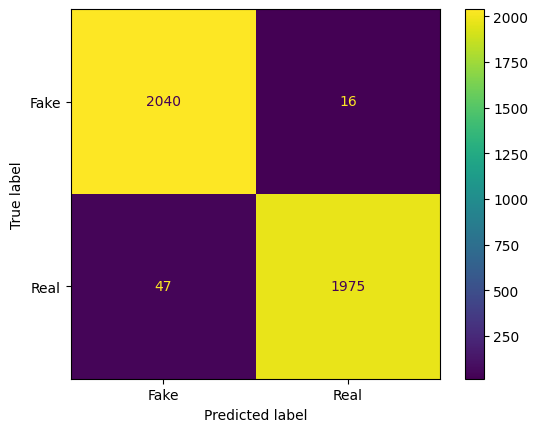

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_true.argmax(axis=1), y_pred.argmax(axis=1))
cmd = ConfusionMatrixDisplay(cm, display_labels=['Fake','Real'])
cmd.plot()

In [ ]:
!pip install lime -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
from lime.lime_text import LimeTextExplainer

In [ ]:
class_names = ['Real','Fake']
explainer = LimeTextExplainer(class_names=class_names)
model= bert_classifier
def predictor(text):
    input_ids, attention_mask= preprocessing_for_bert(text)
    input_ids = input_ids.to(device)
    attention_mask = attention_mask.to(device)
    with torch.no_grad():
      logits = model(input_ids, attention_mask)
    probas = F.softmax(logits, dim=1).cpu().numpy()
    return probas

In [ ]:
idx= 322
print('Text input to test:', X_test[idx])
print('Actual label of the input text:', y_test[idx])

Text input to test: adobochron 7 Comments A rendering of the Trump Tower in Makati City, Philippines 
MAKATI CITY, Philippines ( The Adobo Chronicles) – When completed by the end of 2016, the Trump Tower in the Philippines will be among the country’s tallest buildings . But the Trump name may disappear from this upscale residential building. 
Launched in 2012, Trump Tower is a joint venture between Century Properties and the Trump Organization. It will be managed by Century Properties Management Inc. To rise at 250 meters above ground, the 56-story building is designed by award-winning international architectural firm Broadway Malyan. 
“It’s really just an iconic, modern building, very tall, very chic, something that really symbolizes everything that a Trump project means,” said Eric Trump, son of Donald, and executive vice president of development and acquisition. 
It is located at the corner of Kalayaan Avenue and Salamanca Street in Makati City. 
But today, Philippine President Rodr

In [ ]:
text = "A rendering of the Trump Tower in Makati City, Philippines MAKATI CITY, Philippines ( The Adobo Chronicles) – When completed by the end of 2016, the Trump Tower in the Philippines will be among the country’s tallest buildings . But the Trump name may disappear from this upscale residential building. Launched in 2012, Trump Tower is a joint venture between Century Properties and the Trump Organization. It will be managed by Century Properties Management Inc. To rise at 250 meters above ground, the 56-story building is designed by award-winning international architectural firm Broadway Malyan. “It’s really just an iconic, modern building, very tall, very chic, something that really symbolizes everything that a Trump project means,” said Eric Trump, son of Donald, and executive vice president of development and acquisition. It is located at the corner of Kalayaan Avenue and Salamanca Street in Makati City"
exp = explainer.explain_instance(text, predictor, num_features=10,num_samples=2000, top_labels=1)
exp.show_in_notebook(text=text)

In [ ]:
actual_ranks

array([[0.0477733 , 0.9522267 ],
       [0.45282036, 0.5471797 ],
       [0.03219321, 0.9678068 ],
       ...,
       [0.1623642 , 0.83763576],
       [0.01995994, 0.9800401 ],
       [0.00438282, 0.99561715]], dtype=float32)

In [ ]:
lime_ranks

[0.10610602875130344,
 -0.05394909736789162,
 0.0389753732591595,
 0.03779104480915636,
 -0.03258281557568929,
 -0.02693944198420146,
 -0.023495159917092705,
 0.023036878456961556,
 -0.022575330110563143,
 0.019637894480878746]

In [ ]:
actual_ranks_top10

array([0.45282036, 0.45282036, 0.45282036, 0.45282036, 0.45282036,
       0.45282036, 0.45282036, 0.45282036, 0.45282036, 0.45282036],
      dtype=float32)

In [ ]:
# Calculate Kendall Tau correlation between LIME and actual predictions
lime_ranks = [i[1] for i in exp.as_list()]
actual_ranks = predictor(text)
actual_ranks_top10 = -np.sort(-actual_ranks[:,0])[:10]
kendall_tau, _ = kendalltau(lime_ranks, actual_ranks_top10)

# Print Kendall Tau correlation
print(f'\nKendall Tau Correlation: {kendall_tau}')


Kendall Tau Correlation: nan


In [ ]:
torch.cuda.empty_cache()

In [ ]:
##TFIDF vectorization...

# Install necessary packages
# pip install pandas numpy sklearn

import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split


# TF-IDF Vectorization
vectorizer = TfidfVectorizer(stop_words='english')
X_test_tfidf = vectorizer.fit_transform(X_test)

# Get feature names (words) from the TF-IDF vectorizer
feature_names = vectorizer.get_feature_names_out()

# Separate positive and negative class indices
positive_indices = (y_test == 1)
negative_indices = (y_test == 0)

# Calculate the mean TF-IDF scores for each class
mean_tfidf_positive = X_test_tfidf[positive_indices].mean(axis=0)
mean_tfidf_negative = X_test_tfidf[negative_indices].mean(axis=0)

# Get the indices of top N words for each class
top_n_words = 10
top_positive_indices = mean_tfidf_positive.argsort()[0, -top_n_words:][::-1]
top_negative_indices = mean_tfidf_negative.argsort()[0, -top_n_words:][::-1]

# Get the top N words for each class
top_positive_words = [feature_names[i] for i in top_positive_indices]
top_negative_words = [feature_names[i] for i in top_negative_indices]

# Print the top N words for each class
print('Top words in Positive Class:')
print(top_positive_words)

print('\nTop words in Negative Class:')
print(top_negative_words)


Top words in Positive Class:
[array([['just', 'said', 'russia', 'fbi', 'people', 'election', '2016',
        'hillary', 'trump', 'clinton']], dtype=object)]

Top words in Negative Class:
[array([['state', 'news', 'like', 'ms', 'new', 'people', 'president',
        'trump', 'said', 'mr']], dtype=object)]


In [ ]:
class_names = ['Real','Fake']
model= bert_classifier
def predictor(text):
    input_ids, attention_mask= preprocessing_for_bert(text)
    input_ids = input_ids.to(device)
    attention_mask = attention_mask.to(device)
    with torch.no_grad():
      logits = model(input_ids, attention_mask)
    probas = F.softmax(logits, dim=1).cpu().numpy()
    return probas

text = "Ernie Els, known as the Big Easy, created a little strife on social media this month by playing golf with President Trump and Japan’s prime minister, Shinzo Abe, at Trump National Golf Club in Jupiter, Fla. As the PGA Tour moves this week to PGA National Resort and Spa, a   drive from Trump National, it was natural to wonder: How many of Els’s peers on the tour, if extended the same invitation, would say yes? At Riviera Country Club in Los Angeles last week, I asked more than   of the Genesis Open field that question, granting the respondents anonymity so they wouldn’t risk the wrath of their Twitter followers or, in the case of at least one pro, the fury of his wife. The players range in age from the early 20s to late 40s. They represent nine countries and make their homes in 14 American states, including four that voted overwhelmingly Democratic in last year’s presidential election. Of the 56 players polled, 50  —   or 89. 3 percent  —   said they would play golf with Trump if asked. Only three said they would not. The remaining three declined to answer. The results were hardly surprising. The clubhouses at PGA Tour stops have long trended Republican, and the sport’s target demographic  —   rich, mostly white men  —   is far different from the women, minorities, immigrants and Muslims who have at times been the most offended by the president’s statements and positions."

explainer = LimeTextExplainer(class_names=class_names)
exp = explainer.explain_instance(text, predictor, num_features=10,num_samples=2000)
exp.show_in_notebook(text=text)

In [ ]:
# Calculate Kendall Tau correlation between LIME and actual predictions
lime_ranks = [i[1] for i in exp.as_list()]
actual_ranks = predictor(text)
actual_ranks_top10 = -np.sort(-actual_ranks[:,0])[:10]
kendall_tau, _ = kendalltau(lime_ranks, actual_ranks_top10)

# Print Kendall Tau correlation
print(f'\nKendall Tau Correlation: {kendall_tau}')


Kendall Tau Correlation: nan


In [ ]:
torch.cuda.empty_cache()

In [ ]:
class_names = ['Real','Fake']
#Function to produce lime explaination on input text
def lime_explainer(text, model, class_names):
    input_ids, attention_mask= preprocessing_for_bert(text)
    input_ids = input_ids.to(device)
    attention_mask = attention_mask.to(device)
    with torch.no_grad():
      logits = model(input_ids, attention_mask)
    probas = F.softmax(logits, dim=1).cpu().numpy()
    explainer = LimeTextExplainer(class_names=class_names)
    exp = explainer.explain_instance(text, predictor, num_features=10,num_samples=2000, top_labels=1)
    torch.cuda.empty_cache()
    return exp.show_in_notebook(text=text)


In [ ]:
lime_explainer(text, model, class_names)

In [ ]:
from scipy.stats import kendalltau

In [ ]:
#explanation = explainer.explain_instance(text, predictor, num_features=10,num_samples=1000, labels =(1,))

# Print LIME explanation
print('LIME Explanation:')
print(exp.as_list())

LIME Explanation:
[('Philippines', 0.10924626719709181), ('the', -0.05983192111973888), ('tallest', -0.038676107123190626), ('Trump', 0.03852053282777247), ('from', -0.03448991869932525), ('award', 0.026100085198590972), ('rendering', 0.025974594699261878), ('be', 0.021311660089483486), ('is', 0.018374412531201333), ('disappear', 0.013026319637875898)]


In [ ]:
predictor(text)

array([[0.0477733 , 0.9522267 ],
       [0.45282036, 0.5471797 ],
       [0.03219321, 0.9678068 ],
       ...,
       [0.1623642 , 0.83763576],
       [0.01995994, 0.9800401 ],
       [0.00438282, 0.99561715]], dtype=float32)

In [ ]:
exp.as_map()

{1: [(9, 0.10924626719709181),
  (3, -0.05983192111973888),
  (25, -0.038676107123190626),
  (4, 0.03852053282777247),
  (31, -0.03448991869932525),
  (61, 0.026100085198590972),
  (1, 0.025974594699261878),
  (21, 0.021311660089483486),
  (38, 0.018374412531201333),
  (30, 0.013026319637875898)]}

In [ ]:
# Calculate Kendall Tau correlation between LIME and actual predictions
lime_ranks = [i[0] for i in exp.as_list()]
actual_ranks = predictor(text)
actual_ranks_top10 = -np.sort(-actual_ranks[:,0])[:10]
kendall_tau, _ = kendalltau(lime_ranks, actual_ranks_top10)

# Print Kendall Tau correlation
print(f'\nKendall Tau Correlation: {kendall_tau}')


Kendall Tau Correlation: nan


In [ ]:
arr_values = predictor(text)[:,0]
indices = arr_values.argsort()[::-1][:10]
pred_values = arr_values[indices]

In [ ]:
class_names = ['Reliable','Unreliable']
model= bert_classifier
def predictor(text):
    input_ids, attention_mask= preprocessing_for_bert(text)
    input_ids = input_ids.to(device)
    attention_mask = attention_mask.to(device)
    with torch.no_grad():
      logits = model(input_ids, attention_mask)
    probas = F.softmax(logits, dim=1).cpu().numpy()
    return probas

text = "Hillary Clinton Appears Disoriented And Confused At New York Airport Day Before Presidential Election A few seconds later, her handlers become aware that she's \
having a Parkinson's freeze moment, and immediately swarm around her pushing the video cameras backwards. But not before video of her is recorded showing she doesn't know \
what she's supposed to do.   After Hillary Clinton posed for photos with the media covering her, she was confused about whether she needed to board the awaiting plane or get \
in the motorcade that had just dropped her off. \nHillary Clinton was at the White Plains, New York airport about to start her day, when she exhibited some startling behavior . \
It was the very beginning of her day, so presumably she was rested and alert as she prepared to hit the campaign trail"

explainer = LimeTextExplainer(class_names=class_names)
exp = explainer.explain_instance(text, predictor, num_features=10,num_samples=1000)
exp.show_in_notebook(text=text)

In [ ]:
exp.as_list(label=1)

[('and', -0.009787994838348866),
 ('Clinton', 0.008250005117546155),
 ('A', -0.007776382155831177),
 ('Hillary', 0.007691117777003209),
 ('Appears', 0.007128094217187436),
 ('Disoriented', 0.006318244402613873),
 ('trail', 0.005594250038554084),
 ('campaign', 0.0048129905210386225),
 ('rested', 0.00452688571622932),
 ('a', 0.0044128887490045635)]

In [ ]:
idx= 100
print('Text input to test:', X_test[idx])
print('Actual label of the input text:', y_test[idx])


Text input to test: GENEVA (AFP)  —   European countries must stop returning asylum seekers to Hungary due to deteriorating conditions there for new arrivals including children, and allegations of abuse, the United Nations said Monday. [The situation for asylum seekers and other migrants has long been considered dire in Hungary, but it has worsened since the country last month introduced a new law on the systematic detention of all asylum seekers.  “I urge states to suspend any Dublin transfer of   to this country until the Hungarian authorities bring their practices and policies in line with European and international law,” said Filippo Grandi, United Nations High Commissioner for Refugees. The   Dublin Regulation, which aims to stop people making asylum claims in multiple countries by requiring asylum seekers to be sent back to the first European country they arrived in, applies to European Union nations as well as   Switzerland and Norway. Grandi said he was “encouraged” by a Europe

In [ ]:
text = "European countries must stop returning asylum seekers to Hungary due to deteriorating conditions there for new arrivals including children, and allegations of abuse, \
the United Nations said Monday. [The situation for asylum seekers and other migrants has long been considered dire in Hungary, but it has worsened since the country last month \
introduced a new law on the systematic detention of all asylum seekers.  “I urge states to suspend any Dublin transfer of   to this country until the Hungarian authorities bring \
their practices and policies in line with European and international law,” said Filippo Grandi, United Nations High Commissioner for Refugees"

exp = explainer.explain_instance(text, predictor, num_features=10,num_samples=2000, top_labels=1)
exp.show_in_notebook(text=text)

In [ ]:
class_names = ['Reliable','Unreliable']
#Function to produce lime explaination on input text
def lime_explainer(text, model, class_names):
    input_ids, attention_mask= preprocessing_for_bert(text)
    input_ids = input_ids.to(device)
    attention_mask = attention_mask.to(device)
    with torch.no_grad():
      logits = model(input_ids, attention_mask)
    probas = F.softmax(logits, dim=1).cpu().numpy()
    explainer = LimeTextExplainer(class_names=class_names)
    exp = explainer.explain_instance(text, predictor, num_features=10,num_samples=1000)
    torch.cuda.empty_cache()
    return exp.show_in_notebook(text=text)


In [ ]:
idx= 505
print('Text input to test:', X_test[idx])
print('Actual label of the input text:', y_test[idx])


Text input to test: Well it was a no brainer for Killery to want everybody to vote for her before all the info on her wild e-mail handling came out. 
There are a lot of states that will not allow you to change your early vote!! 
I don’t think it will matter because she will more than likely have the electoral vote in her favor. 
And yes if google was checking this trend they more than likely would have molested it by now. 
Let’s prey that enough people in the swing states that allow people to change their vote will do so.
Actual label of the input text: 1


In [ ]:
text ="Well it was a no brainer for Killery to want everybody to vote for her before all the info on her wild e-mail handling came out. \
There are a lot of states that will not allow you to change your early vote!! \
I don’t think it will matter because she will more than likely have the electoral vote in her favor. \
And yes if google was checking this trend they more than likely would have molested it by now. \
Let’s prey that enough people in the swing states that allow people to change their vote will do so."

lime_explainer(text, model, class_names)

In [ ]:
idx= 222
print('Text input to test:', X_test[idx])
print('Actual label of the input text:', y_test[idx])

Text input to test: Ernie Els, known as the Big Easy, created a little strife on social media this month by playing golf with President Trump and Japan’s prime minister, Shinzo Abe, at Trump National Golf Club in Jupiter, Fla. As the PGA Tour moves this week to PGA National Resort and Spa, a   drive from Trump National, it was natural to wonder: How many of Els’s peers on the tour, if extended the same invitation, would say yes? At Riviera Country Club in Los Angeles last week, I asked more than   of the Genesis Open field that question, granting the respondents anonymity so they wouldn’t risk the wrath of their Twitter followers or, in the case of at least one pro, the fury of his wife. The players range in age from the early 20s to late 40s. They represent nine countries and make their homes in 14 American states, including four that voted overwhelmingly Democratic in last year’s presidential election. Of the 56 players polled, 50  —   or 89. 3 percent  —   said they would play golf 

In [ ]:
class_names = ['Reliable','Unreliable']
model= bert_classifier
def predictor(text):
    input_ids, attention_mask= preprocessing_for_bert(text)
    input_ids = input_ids.to(device)
    attention_mask = attention_mask.to(device)
    with torch.no_grad():
      logits = model(input_ids, attention_mask)
    probas = F.softmax(logits, dim=1).cpu().numpy()
    return probas

text = "Ernie Els, known as the Big Easy, created a little strife on social media this month by playing golf with President Trump and Japan’s prime minister, Shinzo Abe, at Trump National Golf Club in Jupiter, Fla. As the PGA Tour moves this week to PGA National Resort and Spa, a   drive from Trump National, it was natural to wonder: How many of Els’s peers on the tour, if extended the same invitation, would say yes? At Riviera Country Club in Los Angeles last week, I asked more than   of the Genesis Open field that question, granting the respondents anonymity so they wouldn’t risk the wrath of their Twitter followers or, in the case of at least one pro, the fury of his wife. The players range in age from the early 20s to late 40s. They represent nine countries and make their homes in 14 American states, including four that voted overwhelmingly Democratic in last year’s presidential election. Of the 56 players polled, 50  —   or 89. 3 percent  —   said they would play golf with Trump if asked. Only three said they would not. The remaining three declined to answer. The results were hardly surprising. The clubhouses at PGA Tour stops have long trended Republican, and the sport’s target demographic  —   rich, mostly white men  —   is far different from the women, minorities, immigrants and Muslims who have at times been the most offended by the president’s statements and positions."

explainer = LimeTextExplainer(class_names=class_names)
exp = explainer.explain_instance(text, predictor, num_features=10,num_samples=1322)
exp.show_in_notebook(text=text)

In [ ]:
idx= 322
print('Text input to test:', X_test[idx])
print('Actual label of the input text:', y_test[idx])

Text input to test: adobochron 7 Comments A rendering of the Trump Tower in Makati City, Philippines 
MAKATI CITY, Philippines ( The Adobo Chronicles) – When completed by the end of 2016, the Trump Tower in the Philippines will be among the country’s tallest buildings . But the Trump name may disappear from this upscale residential building. 
Launched in 2012, Trump Tower is a joint venture between Century Properties and the Trump Organization. It will be managed by Century Properties Management Inc. To rise at 250 meters above ground, the 56-story building is designed by award-winning international architectural firm Broadway Malyan. 
“It’s really just an iconic, modern building, very tall, very chic, something that really symbolizes everything that a Trump project means,” said Eric Trump, son of Donald, and executive vice president of development and acquisition. 
It is located at the corner of Kalayaan Avenue and Salamanca Street in Makati City. 
But today, Philippine President Rodr

In [ ]:
text = "A rendering of the Trump Tower in Makati City, Philippines MAKATI CITY, Philippines ( The Adobo Chronicles) – When completed by the end of 2016, the Trump Tower in the Philippines will be among the country’s tallest buildings . But the Trump name may disappear from this upscale residential building. Launched in 2012, Trump Tower is a joint venture between Century Properties and the Trump Organization. It will be managed by Century Properties Management Inc. To rise at 250 meters above ground, the 56-story building is designed by award-winning international architectural firm Broadway Malyan. “It’s really just an iconic, modern building, very tall, very chic, something that really symbolizes everything that a Trump project means,” said Eric Trump, son of Donald, and executive vice president of development and acquisition. It is located at the corner of Kalayaan Avenue and Salamanca Street in Makati City"
exp = explainer.explain_instance(text, predictor, num_features=10,num_samples=2000, top_labels=1)
exp.show_in_notebook(text=text)

In [ ]:
#torch.save(bert_classifier, '/content/gdrive/My Drive/harshitha/model.pt')

In [ ]:
#model = torch.load('/content/gdrive/My Drive/harshitha/model.pt')